# LEO Satellite – User AoI Comparison Study
## Comparing: Min-Max AoI | Weighted-Sum AoI | Proportionally Fair AoI (PFAoI)

### References used in this notebook (equations taken verbatim from these papers):
- **[R1]** N. Jones and E. Modiano, *Minimizing Age of Information in Spatially Distributed Random Access Wireless Networks*, IEEE Transactions on Networking, 2024. → PFAoI definition, min-max, weighted sum policies
- **[R2]** Fair Beam Scheduling in LEO Satellite Networks With Reinforcement Learning, *IEEE Transactions on Cognitive Communications and Networking*, VOL. 12, 2026. → distance model, path loss, channel model, AoI update rule
- **[R3]** N. Akar and E. Karasan, *Is Proportional Fair Scheduling Suitable for Age-Sensitive Traffic?*, Computer Networks, 2023. → PF scheduling justification, cellular downlink model
- **[R4]** Xiao et al., *Statistical Age of Information: A Risk-Aware Metric and Its Applications in Status Updates*, IEEE Transactions on Wireless Communications, Vol. 24, No. 3, March 2025. → AoI process definition, peak AoI
- **[R5]** R. D. Yates et al., *Age of Information: An Introduction and Survey*, IEEE J. Sel. Areas Commun., vol. 39, no. 5, 2021. → AoI sawtooth definition
- **[R6]** Kadota et al., *Scheduling Policies for Minimizing Age of Information in Broadcast Wireless Networks*, IEEE/ACM Transactions on Networking, vol. 26, no. 6, 2018. → scheduling policies, max-weight

### Jain's Fairness Index:
- **[R7]** R. Jain, D. Chiu, W. Hawe, *A Quantitative Measure of Fairness and Discrimination for Resource Allocation in Shared Computer Systems*, DEC Research Report TR-301, 1984. → JFI formula

In [3]:
# ============================================================
# CELL 1: Import all required libraries
# ============================================================

import numpy as np                        # numerical computations
import matplotlib.pyplot as plt           # plotting
import matplotlib.gridspec as gridspec    # subplot layout control
from scipy.special import j1              # Bessel function J1 for antenna gain
import warnings
warnings.filterwarnings('ignore')         # suppress minor runtime warnings

# Set random seed for reproducibility
np.random.seed(42)

# Set global plot style for clean IEEE-style figures
plt.rcParams.update({
    'font.size': 12,
    'axes.labelsize': 13,
    'axes.titlesize': 13,
    'legend.fontsize': 11,
    'figure.dpi': 120,
    'lines.linewidth': 2.0,
    'grid.alpha': 0.3,
})

print("Libraries loaded successfully.")

Libraries loaded successfully.


## Cell 2 — System Parameters
All parameters follow [R2] (Fair Beam Scheduling, IEEE TCCN 2026) and standard LEO link budget values.

In [4]:
# ============================================================
# CELL 2: System Parameters
# All values follow [R2] Fair Beam Scheduling, IEEE TCCN 2026
# ============================================================

# ---------- Satellite orbit parameters ----------
h_sat   = 600e3          # [m] LEO satellite altitude (600 km), typical LEO range 550-1200 km
h_user  = 0.0            # [m] user altitude (ground level)

# ---------- Carrier frequency ----------
fc_GHz  = 2.0            # [GHz] L-band carrier frequency — [R2] states L-band to justify Doppler omission
fc_Hz   = fc_GHz * 1e9   # convert to Hz
c       = 3e8            # [m/s] speed of light
lam     = c / fc_Hz      # [m] wavelength lambda = c / fc

# ---------- Antenna parameters ----------
# Receive antenna gain formula from [R2] eq.(7):
# G_R = 10*log10( eta * (A*pi/lambda)^2 )
eta_ant = 0.55           # antenna efficiency eta (typical value 0.55)
A_ant   = 0.5            # [m^2] receiving antenna aperture area
GR_dB   = 10 * np.log10(eta_ant * (A_ant * np.pi / lam)**2)  # [R2] eq.(7)
GR_lin  = 10**(GR_dB/10) # convert receive gain to linear scale

# Transmit antenna gain (satellite beam) from [R2] eq.(8):
# G_T = G_M * [ J1(u)/(2u) + 36*J3(u)/u^3 ]^2
# For boresight (on-axis) user: theta_uk = 0 → u → 0 → G_T = G_M
GM_dB   = 30.0           # [dBi] maximum satellite antenna gain G_M
GM_lin  = 10**(GM_dB/10) # linear scale

# ---------- Noise ----------
# Noise power: sigma^2 = N0 * B_RB  (defined as noise spectral density x bandwidth)
N0_dBm  = -174.0         # [dBm/Hz] thermal noise spectral density at room temperature
B_RB_Hz = 180e3          # [Hz] bandwidth of one resource block (LTE/5G NR standard: 180 kHz)
N0_lin  = 10**((N0_dBm - 30) / 10)         # convert dBm/Hz to W/Hz
sigma2  = N0_lin * B_RB_Hz                 # [W] noise power sigma^2

# ---------- Transmit power ----------
P_max_dBW = 30.0         # [dBW] max transmit power per beam (10 W = 10 dBW)
P_max_W   = 10**(P_max_dBW/10)             # linear [W]

# ---------- Shadowing ----------
# Shadowing SF ~ N(0, sigma_sf^2) from [R2] eq.(3)
sigma_sf_dB = 1.0        # [dB] standard deviation of log-normal shadowing (light shadowing)

# ---------- Rate threshold ----------
# R_th: minimum rate required for a user to be considered schedulable
# Used in scheduling indicator delta_lu(t) = 1 if R_lu >= R_th
R_th_bps = 50e3          # [bps] 50 kbps threshold (IoT-class status update)

# ---------- Simulation dimensions ----------
U        = 20             # number of users (deliberately kept small for clarity)
T        = 200           # number of time slots to simulate
S        = 10             # total resource blocks per cell per slot  
B_beams  = 1             # number of active beams (single-cell simplified setup)

# ---------- Coverage area ----------
# Users are distributed randomly in a circular cell of radius R_cell
R_cell_m = 150e3         # [m] cell radius (150 km, typical LEO beam footprint)

print(f"Wavelength        lambda = {lam:.4f} m")
print(f"Receive ant. gain GR    = {GR_dB:.2f} dBi")
print(f"Noise power       sigma2 = {10*np.log10(sigma2)+30:.2f} dBm")
print(f"Users U = {U}, Time slots T = {T}, RBs S = {S}")

Wavelength        lambda = 0.1500 m
Receive ant. gain GR    = 17.80 dBi
Noise power       sigma2 = -121.45 dBm
Users U = 20, Time slots T = 200, RBs S = 10


## Cell 3 — User Placement & Channel Model
### Equations from [R2]:
- **Eq.(1):** `d_lu = sqrt( (x_l - x_u)^2 + (y_l - y_u)^2 + (h_l - h_u)^2 )` — 3D distance
- **Eq.(2):** `L_FS = 32.45 + 20*log10(fc_MHz) + 20*log10(d_km)` — free space path loss
- **Eq.(3):** `SF ~ N(0, sigma_sf^2)` — shadowing
- **Eq.(4):** `L_total = L_FS + SF` — total path loss
- **Eq.(5):** `g_lu = 10^(-L_total/10)` — channel gain
- **Eq.(6):** `g_total = g_lu * G_T * G_R` — total channel gain with antenna gains

In [5]:
# ============================================================
# CELL 3: User Placement and Channel Model
# Equations reference: [R2] Fair Beam Scheduling, IEEE TCCN 2026
# ============================================================

# --- Place U users randomly in a circular cell ---
# Use polar coordinates then convert to Cartesian
angles   = np.random.uniform(0, 2*np.pi, U)           # random azimuth angles
# Uniform distribution over disk: radius ~ sqrt(uniform) * R_cell
radii    = np.sqrt(np.random.uniform(0, 1, U)) * R_cell_m  # random radial distances [m]
x_users  = radii * np.cos(angles)                     # x-coordinates of users [m]
y_users  = radii * np.sin(angles)                     # y-coordinates of users [m]

# Satellite is directly overhead (nadir pointing)
x_sat, y_sat = 0.0, 0.0                               # satellite ground track position

# --- Compute 3D slant range (distance) per user ---
# [R2] Eq.(1): d_lu = sqrt( (x_l-x_u)^2 + (y_l-y_u)^2 + (h_l-h_u)^2 )
d_users  = np.sqrt(
    (x_sat - x_users)**2 +                            # horizontal separation x
    (y_sat - y_users)**2 +                            # horizontal separation y
    (h_sat - h_user)**2                               # vertical (altitude) separation
)  # [m] slant range for each user

# Elevation angle: needed only for info printout
# sin(elevation) = h_sat / d_lu
elev_deg = np.degrees(np.arcsin(h_sat / d_users))     # [degrees] elevation angle

# --- Free space path loss [R2] Eq.(2) ---
# L_FS [dB] = 32.45 + 20*log10(fc [MHz]) + 20*log10(d [km])
fc_MHz   = fc_Hz / 1e6                                # frequency in MHz
d_km     = d_users / 1e3                              # distance in km
L_FS_dB  = 32.45 + 20*np.log10(fc_MHz) + 20*np.log10(d_km)  # [R2] Eq.(2)

# --- Shadowing [R2] Eq.(3): SF ~ N(0, sigma_sf^2) ---
# Each user gets a fixed shadowing value (quasi-static channel: changes slowly)
SF_dB    = np.random.normal(0, sigma_sf_dB, U)        # [R2] Eq.(3)

# --- Total path loss [R2] Eq.(4): L_total = L_FS + SF ---
L_total_dB = L_FS_dB + SF_dB                          # [R2] Eq.(4)

# --- Channel gain [R2] Eq.(5): g_lu = 10^(-L_total/10) ---
g_lu     = 10**(-L_total_dB / 10)                     # [R2] Eq.(5) — dimensionless linear

# --- Transmit antenna gain ---
# [R2] Eq.(8): G_T = G_M * [J1(u)/(2u) + 36*J3(u)/u^3]^2
# For simplicity with boresight users (beam center), u→0 → G_T = G_M
# For off-axis users, compute off-axis angle theta_uk from user position
theta_3dB_rad = np.radians(1.5)                       # [rad] 3dB beamwidth (1.5 deg, typical LEO)

# Off-axis angle theta_uk from beam center (nadir direction)
# sin(theta_uk) = ground_distance / slant_range
ground_dist = np.sqrt((x_sat - x_users)**2 + (y_sat - y_users)**2)  # horizontal dist [m]
theta_uk_rad = np.arctan2(ground_dist, h_sat)          # [rad] off-axis angle

# [R2] Eq.(9): u = 2.07123 * sin(theta_uk) / sin(theta_3dB)
u_vals   = 2.07123 * np.sin(theta_uk_rad) / np.sin(theta_3dB_rad)  # [R2] Eq.(9)

def bessel_antenna_gain(u, GM_lin):
    """
    Compute transmit antenna gain using [R2] Eq.(8):
    G_T = G_M * [ J1(u)/(2u) + 36*J3(u)/u^3 ]^2
    For u=0 (boresight), limit → G_M
    J1: Bessel function of first kind order 1
    J3: Bessel function of first kind order 3
    """
    from scipy.special import jv
    gains = np.zeros_like(u, dtype=float)
    for i, ui in enumerate(u):
        if abs(ui) < 1e-6:                             # boresight: limit is G_M
            gains[i] = GM_lin
        else:
            J1u = jv(1, ui)                            # J1(u)
            J3u = jv(3, ui)                            # J3(u)
            # [R2] Eq.(8)
            bracket = J1u / (2*ui) + 36*J3u / (ui**3)
            gains[i] = GM_lin * bracket**2
    return gains

GT_lin   = bessel_antenna_gain(u_vals, GM_lin)         # [R2] Eq.(8) linear gain per user

# --- Total channel gain [R2] Eq.(6): g_total = g_lu * G_T * G_R ---
g_total  = g_lu * GT_lin * GR_lin                     # [R2] Eq.(6)

# --- SNR per user (MRT beamforming, no interference, OFDMA) ---
# [R2] Eq.(14): SNR_lu = P * |h_lu * w^H|^2 / sigma^2
# Under MRT: w = h/||h|| → |h*w^H|^2 = ||h||^2 = g_total (power of channel)
# Equal power allocation: P_lu = P_max / U
P_per_user = P_max_W / U                             # equal power per user [W]
SNR_users  = P_per_user * g_total / sigma2            # [R2] Eq.(14) — linear SNR per user
SNR_dB     = 10 * np.log10(SNR_users)                 # [dB] for display

# Print user channel summary
print("User channel summary:")
print(f"{'User':>5} {'Dist(km)':>10} {'Elev(deg)':>10} {'L_total(dB)':>12} {'SNR(dB)':>10}")
print("-" * 52)
for u_idx in range(U):
    print(f"{u_idx+1:>5} {d_km[u_idx]:>10.1f} {elev_deg[u_idx]:>10.1f} "
          f"{L_total_dB[u_idx]:>12.1f} {SNR_dB[u_idx]:>10.2f}")

User channel summary:
 User   Dist(km)  Elev(deg)  L_total(dB)    SNR(dB)
----------------------------------------------------
    1      611.4       78.9        154.2      15.43
    2      602.6       84.7        153.0      26.64
    3      605.5       82.3        154.9      -1.87
    4      606.8       81.4        152.9      17.51
    5      608.5       80.4        154.4       6.94
    6      614.5       77.5        152.3      11.21
    7      603.7       83.6        152.8      13.90
    8      609.6       79.8        154.4       9.01
    9      611.0       79.1        154.9      14.88
   10      600.9       86.9        154.2      47.32
   11      611.3       79.0        154.1      15.62
   12      603.2       84.1        153.8      14.56
   13      601.2       86.4        152.6      40.35
   14      617.5       76.3        153.6      12.78
   15      617.8       76.2        153.8      11.29
   16      615.0       77.3        155.3      10.67
   17      605.7       82.1        154.5 

## Cell 4 — Achievable Rate and Scheduling Indicator
### Equations from [R2]:
- **Eq.(15):** `R_lu = K * B_RB * log2(1 + SNR)` — achievable rate with K resource blocks
- **Eq.(16):** `delta_lu = 1 if R_lu >= R_th AND user has pending request, else 0`

In [6]:
# ============================================================
# CELL 4: Rate and Scheduling Functions
# [R2] Eq.(15): R_lu = K * B_RB * log2(1 + SNR_lu)
# [R2] Eq.(16): AoI update rule
# ============================================================

def compute_rate(K_rbs, snr_lin, B_RB=B_RB_Hz):
    """
    Compute achievable rate using Shannon formula.
    [R2] Eq.(15): R_lu(t) = K_lu(t) * B_RB * log2(1 + SNR_lu(t))

    Parameters:
    -----------
    K_rbs   : int   — number of RBs allocated to user
    snr_lin : float — linear SNR of the user
    B_RB    : float — bandwidth per RB in Hz

    Returns:
    --------
    rate    : float — achievable rate in bps
    """
    return K_rbs * B_RB * np.log2(1 + snr_lin)        # [R2] Eq.(15)


def update_aoi(A_prev, delta):
    """
    Update AoI for one time slot.
    [R2] Eq.(16): A_lu(t+1) = 1 if delta=1, else A_lu(t)+1
    Also referenced in [R5] Yates et al. 2021 (sawtooth AoI process)

    Parameters:
    -----------
    A_prev : int — AoI at current slot
    delta  : int — scheduling indicator (1=scheduled+decoded, 0=not)

    Returns:
    --------
    A_next : int — AoI at next slot
    """
    if delta == 1:
        return 1                                       # [R2] Eq.(16): reset to 1 on success
    else:
        return A_prev + 1                              # [R2] Eq.(16): increment on failure


def jains_fairness_index(aoi_values):
    """
    Jain's Fairness Index (JFI) for AoI values.
    [R7] R. Jain et al., 1984: JFI = (sum(x_i))^2 / (n * sum(x_i^2))
    JFI = 1 means perfect fairness, JFI < 1 means some users have much higher AoI.
    NOTE: for AoI, lower AoI = fresher, so JFI close to 1 means all users
    experience similarly fresh information.

    Parameters:
    -----------
    aoi_values : array of AoI per user (time-averaged)

    Returns:
    --------
    jfi : float in (0,1]
    """
    n   = len(aoi_values)
    return (np.sum(aoi_values))**2 / (n * np.sum(aoi_values**2))  # [R7]


print("Rate and AoI update functions defined.")

# Show rate achievable with 1 RB vs 6 RBs per user for context
print("\nRate achievable per user with K=1 RB vs K=6 RBs (equal power):")
print(f"{'User':>5} {'SNR(dB)':>9} {'R_K1(kbps)':>12} {'R_K6(kbps)':>12} {'delta K=1':>10}")
print("-" * 55)
for u_idx in range(U):
    r1 = compute_rate(1, SNR_users[u_idx]) / 1e3       # rate with 1 RB [kbps]
    r6 = compute_rate(6, SNR_users[u_idx]) / 1e3       # rate with 6 RBs [kbps]
    d1 = 1 if compute_rate(1, SNR_users[u_idx]) >= R_th_bps else 0  # schedulable?
    print(f"{u_idx+1:>5} {SNR_dB[u_idx]:>9.2f} {r1:>12.1f} {r6:>12.1f} {d1:>10}")

Rate and AoI update functions defined.

Rate achievable per user with K=1 RB vs K=6 RBs (equal power):
 User   SNR(dB)   R_K1(kbps)   R_K6(kbps)  delta K=1
-------------------------------------------------------
    1     15.43        929.7       5578.2          1
    2     26.64       1593.7       9561.9          1
    3     -1.87        130.0        780.1          1
    4     17.51       1051.5       6308.9          1
    5      6.94        463.0       2777.9          1
    6     11.21        689.0       4133.9          1
    7     13.90        841.7       5050.4          1
    8      9.01        569.7       3418.0          1
    9     14.88        897.8       5386.8          1
   10     47.32       2829.5      16976.8          1
   11     15.62        940.8       5644.7          1
   12     14.56        879.3       5276.0          1
   13     40.35       2412.9      14477.3          1
   14     12.78        777.4       4664.6          1
   15     11.29        693.7       4162.2     

## Cell 5 — Three Scheduling Policies
All three policies are from **[R1]** Jones & Modiano, IEEE Trans. Networking 2024, and **[R6]** Kadota et al., IEEE/ACM Trans. Networking 2018:

1. **Min-Max AoI**: `min max_u A_lu(t)` → always serve the user with the highest AoI first
2. **Weighted-Sum AoI (Max-Weight)**: `min Σ A_lu(t)` → greedy, serve users with largest absolute AoI  
3. **Proportionally Fair AoI (PFAoI)**: `min Σ log(A_lu(t))` → [R1] defines this as the PF policy for AoI

In [7]:
# ============================================================
# CELL 5: Three Scheduling Policies
# Reference: [R1] Jones & Modiano, IEEE Trans. Networking, 2024
#            [R6] Kadota et al., IEEE/ACM Trans. Networking, 2018
# ============================================================

def allocate_rbs_proportional(aoi_vec, S_rbs, snr_vec, R_th):
    """
    Allocate S resource blocks across U users proportional to their AoI.
    Users with higher AoI get more RBs → more likely to cross R_th → AoI resets.
    This is the RB allocation policy from [R2] Section IX.
    Constraint: sum_u K_lu <= S  ([R2] Eq. 24)

    Parameters:
    -----------
    aoi_vec : array [U] — current AoI of each user
    S_rbs   : int       — total RBs available
    snr_vec : array [U] — linear SNR per user
    R_th    : float     — rate threshold in bps

    Returns:
    --------
    K_alloc : array [U] — number of RBs allocated to each user
    delta   : array [U] — scheduling indicators (1 if rate >= R_th)
    """
    U_loc   = len(aoi_vec)
    # Weights proportional to AoI (higher AoI → more RBs)
    weights = aoi_vec.astype(float)
    weights = weights / weights.sum()              # normalize to sum=1

    # Allocate RBs proportionally, ensure integer and at least 1 per user
    K_float = weights * S_rbs
    K_alloc = np.floor(K_float).astype(int)        # floor allocation
    remainder = S_rbs - K_alloc.sum()             # leftover RBs

    # Give leftover RBs to users with largest fractional parts
    fractions = K_float - np.floor(K_float)
    top_idx   = np.argsort(-fractions)[:remainder]
    K_alloc[top_idx] += 1                          # assign remaining RBs

    # Ensure every user gets at least 0 RBs (non-negative constraint [R2] Eq.25)
    K_alloc = np.maximum(K_alloc, 0)

    # Compute scheduling indicator: delta=1 if rate >= R_th ([R2] Eq.16 + scheduling rule)
    delta = np.zeros(U_loc, dtype=int)
    for i in range(U_loc):
        rate_i = compute_rate(K_alloc[i], snr_vec[i])    # [R2] Eq.(15)
        if rate_i >= R_th:
            delta[i] = 1                           # successfully scheduled
    return K_alloc, delta


def policy_minmax(aoi_vec, S_rbs, snr_vec, R_th, U_loc):
    """
    Min-Max AoI Policy: serve the user with the highest AoI first.
    Objective: min max_u A_lu(t)
    Reference: [R1] Jones & Modiano 2024, Section III-B (min-max policy)
               [R6] Kadota et al. 2018 (Max-Weight = priority to highest AoI)

    Strategy: Sort users by AoI descending. Give RBs one-by-one starting
    from the user with highest AoI until that user's rate crosses R_th,
    then move to next user. Ensures worst-case user is always served first.
    """
    K_alloc = np.zeros(U_loc, dtype=int)           # start: 0 RBs per user
    rbs_left = S_rbs                               # remaining RBs budget

    # Sort users by AoI descending (worst first)
    priority = np.argsort(-aoi_vec)                # highest AoI → index 0

    for idx in priority:                           # iterate users worst→best AoI
        if rbs_left <= 0:
            break                                  # no RBs left
        # Give this user RBs until their rate crosses R_th or RBs run out
        while rbs_left > 0:
            K_alloc[idx] += 1
            rbs_left -= 1
            rate_now = compute_rate(K_alloc[idx], snr_vec[idx])  # [R2] Eq.(15)
            if rate_now >= R_th:
                break                              # this user is now schedulable

    # Compute scheduling indicators
    delta = np.zeros(U_loc, dtype=int)
    for i in range(U_loc):
        if compute_rate(K_alloc[i], snr_vec[i]) >= R_th:
            delta[i] = 1
    return K_alloc, delta


def policy_weighted_sum(aoi_vec, S_rbs, snr_vec, R_th, U_loc):
    """
    Weighted-Sum AoI (Max-Weight) Policy: minimize sum of AoI.
    Objective: min sum_u A_lu(t)
    Reference: [R1] Jones & Modiano 2024, Section III-A (weighted sum policy)
               [R6] Kadota et al. 2018 (Max-Weight scheduling)

    Strategy: Allocate RBs proportional to raw AoI values (not log).
    This is greedy: users with highest absolute AoI get most resources.
    Risk: users with poor channels (low SNR) may always need many RBs
    to cross R_th, causing other users to be starved.
    """
    return allocate_rbs_proportional(aoi_vec, S_rbs, snr_vec, R_th)  # proportional to AoI


def policy_pfaoi(aoi_vec, S_rbs, snr_vec, R_th, U_loc):
    """
    Proportionally Fair AoI (PFAoI) Policy: minimize sum of log(AoI).
    Objective: min sum_u log(A_lu(t))
    Reference: [R1] Jones & Modiano 2024 — defines PFAoI as log-utility objective
               [R3] Akar & Karasan 2023 — validates PF for age-sensitive traffic
               [R2] eq.(17)+(18) — PFAoI definition and cell-level aggregation

    Strategy: Allocate RBs proportional to log(AoI) instead of raw AoI.
    The log function compresses large AoI differences, preventing the
    scheduler from ignoring low-AoI users entirely (as weighted-sum does)
    while still prioritizing high-AoI users over low-AoI users.
    This achieves the balance between average performance and fairness.
    """
    # Use log(AoI) as weights — [R1] Jones & Modiano 2024
    log_aoi  = np.log(aoi_vec.astype(float) + 1)  # log(A+1) avoids log(0) for A=1
    return allocate_rbs_proportional(log_aoi, S_rbs, snr_vec, R_th)  # proportional to log(AoI)


print("Three scheduling policies defined:")
print("  1. Min-Max AoI    : serve highest-AoI user first [R1],[R6]")
print("  2. Weighted-Sum   : proportional to raw AoI [R1],[R6]")
print("  3. PFAoI          : proportional to log(AoI) [R1],[R2],[R3]")

Three scheduling policies defined:
  1. Min-Max AoI    : serve highest-AoI user first [R1],[R6]
  2. Weighted-Sum   : proportional to raw AoI [R1],[R6]
  3. PFAoI          : proportional to log(AoI) [R1],[R2],[R3]


## Cell 6 — Run Simulation for All Three Policies

In [8]:
# ============================================================
# CELL 6: Run simulation for all three policies
# AoI update: [R2] Eq.(16), [R5] Yates et al. 2021
# ============================================================

def run_simulation(policy_fn, snr_vec, U_loc, T_slots, S_rbs, R_th):
    """
    Simulate T time slots for a given scheduling policy.

    At each slot:
      1. Policy computes RB allocation K_lu(t) for each user
      2. Scheduling indicator delta_lu(t) set if R_lu >= R_th
      3. AoI updated per [R2] Eq.(16)

    Parameters:
    -----------
    policy_fn : callable — scheduling policy function
    snr_vec   : array [U] — fixed per-user linear SNR
    U_loc     : int — number of users
    T_slots   : int — number of time slots
    S_rbs     : int — RBs per slot
    R_th      : float — rate threshold [bps]

    Returns:
    --------
    aoi_history  : array [T, U] — AoI of each user at each time slot
    delta_history: array [T, U] — scheduling decisions
    K_history    : array [T, U] — RB allocations
    """
    aoi_history   = np.zeros((T_slots, U_loc), dtype=int)   # store AoI per slot
    delta_history = np.zeros((T_slots, U_loc), dtype=int)   # store delta per slot
    K_history     = np.zeros((T_slots, U_loc), dtype=int)   # store K_lu per slot

    # Initialize AoI: all users start with AoI = 1 (fresh start)
    # [R5] Yates et al. 2021: AoI at t=0 is 1 (first slot after system start)
    A_current = np.ones(U_loc, dtype=int)                    # initial AoI vector

    for t in range(T_slots):                                 # iterate over time slots

        # Step 1: Record current AoI at start of slot t
        aoi_history[t] = A_current.copy()

        # Step 2: Run scheduling policy to get RB allocations and delta
        K_alloc, delta = policy_fn(
            A_current,                                       # current AoI vector
            S_rbs,                                           # total RBs available
            snr_vec,                                         # per-user SNR
            R_th,                                            # rate threshold
            U_loc                                            # number of users
        )

        # Step 3: Record allocation and scheduling decisions
        delta_history[t] = delta
        K_history[t]     = K_alloc

        # Step 4: Update AoI for each user using [R2] Eq.(16)
        # A_lu(t+1) = 1 if delta=1, else A_lu(t)+1
        A_next = np.zeros(U_loc, dtype=int)
        for i in range(U_loc):
            A_next[i] = update_aoi(A_current[i], delta[i])  # [R2] Eq.(16)
        A_current = A_next                                   # advance time

    return aoi_history, delta_history, K_history


# Run all three policies with the same channel conditions (SNR_users fixed)
print("Running simulations...")

# Policy 1: Min-Max AoI
aoi_mm,  delta_mm,  K_mm  = run_simulation(
    policy_minmax, SNR_users, U, T, S, R_th_bps)
print("  [1/3] Min-Max AoI simulation complete")

# Policy 2: Weighted-Sum AoI (Max-Weight)
aoi_ws,  delta_ws,  K_ws  = run_simulation(
    policy_weighted_sum, SNR_users, U, T, S, R_th_bps)
print("  [2/3] Weighted-Sum AoI simulation complete")

# Policy 3: Proportionally Fair AoI
aoi_pf,  delta_pf,  K_pf  = run_simulation(
    policy_pfaoi, SNR_users, U, T, S, R_th_bps)
print("  [3/3] PFAoI simulation complete")

print("\nAll simulations done.")

Running simulations...
  [1/3] Min-Max AoI simulation complete
  [2/3] Weighted-Sum AoI simulation complete
  [3/3] PFAoI simulation complete

All simulations done.


## Cell 7 — Figure 1: LEO System Setup (Network Topology)

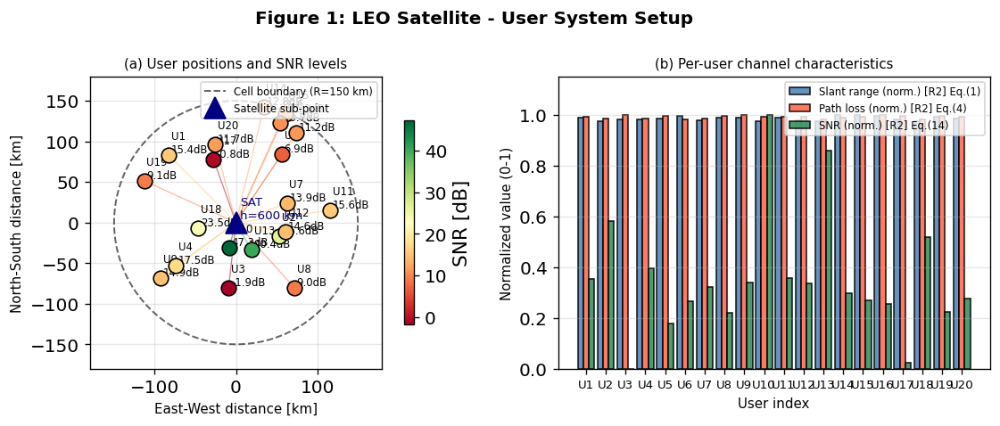

Figure 1 saved.


In [9]:
# ============================================================
# CELL 7: Figure 1 — LEO System Setup / Network Topology
# Shows satellite position, users, cell boundary, SNR of each user
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(10, 4))          # was (14, 6)
fig.suptitle('Figure 1: LEO Satellite - User System Setup', fontsize=12, fontweight='bold')

# ---- Left subplot: spatial layout ----
ax1 = axes[0]

# Draw cell boundary circle
theta_circle = np.linspace(0, 2*np.pi, 300)
ax1.plot(R_cell_m/1e3 * np.cos(theta_circle),
         R_cell_m/1e3 * np.sin(theta_circle),
         'k--', linewidth=1.2, label='Cell boundary (R=150 km)', alpha=0.6)

# Plot satellite sub-satellite point
ax1.plot(0, 0, '^', color='navy', markersize=14, label='Satellite sub-point', zorder=5)
ax1.text(5, 5, f'SAT\nh={h_sat/1e3:.0f} km', fontsize=8, color='navy')

# Color users by SNR
snr_norm   = (SNR_dB - SNR_dB.min()) / (SNR_dB.max() - SNR_dB.min() + 1e-9)
cmap       = plt.cm.RdYlGn
colors_usr = [cmap(v) for v in snr_norm]

for i in range(U):
    ax1.scatter(x_users[i]/1e3, y_users[i]/1e3,
                color=colors_usr[i], s=100, edgecolors='black',
                linewidths=1.0, zorder=4)
    ax1.plot([0, x_users[i]/1e3], [0, y_users[i]/1e3],
             color=colors_usr[i], linewidth=0.8, alpha=0.5)
    ax1.text(x_users[i]/1e3 + 3, y_users[i]/1e3 + 3,
             f'U{i+1}\n{SNR_dB[i]:.1f}dB', fontsize=7, color='black')

ax1.set_xlabel('East-West distance [km]', fontsize=9)
ax1.set_ylabel('North-South distance [km]', fontsize=9)
ax1.set_title('(a) User positions and SNR levels', fontsize=9)
ax1.legend(loc='upper right', fontsize=7)
ax1.set_aspect('equal')
ax1.grid(True, alpha=0.3)
ax1.set_xlim(-R_cell_m/1e3*1.2, R_cell_m/1e3*1.2)
ax1.set_ylim(-R_cell_m/1e3*1.2, R_cell_m/1e3*1.2)

# Colorbar
sm = plt.cm.ScalarMappable(cmap=cmap,
     norm=plt.Normalize(vmin=SNR_dB.min(), vmax=SNR_dB.max()))
sm.set_array([])
plt.colorbar(sm, ax=ax1, label='SNR [dB]', shrink=0.7)

# ---- Right subplot: bar chart ----
ax2 = axes[1]
x_pos  = np.arange(U)
width  = 0.28

ax2.bar(x_pos - width, d_km / d_km.max(),
        width, label='Slant range (norm.) [R2] Eq.(1)',
        color='steelblue', alpha=0.85, edgecolor='black')
ax2.bar(x_pos, L_total_dB / L_total_dB.max(),
        width, label='Path loss (norm.) [R2] Eq.(4)',
        color='tomato', alpha=0.85, edgecolor='black')
ax2.bar(x_pos + width,
        (SNR_dB - SNR_dB.min()) / (SNR_dB.max() - SNR_dB.min()),
        width, label='SNR (norm.) [R2] Eq.(14)',
        color='seagreen', alpha=0.85, edgecolor='black')

ax2.set_xlabel('User index', fontsize=9)
ax2.set_ylabel('Normalized value (0-1)', fontsize=9)
ax2.set_title('(b) Per-user channel characteristics', fontsize=9)
ax2.set_xticks(x_pos)
ax2.set_xticklabels([f'U{i+1}' for i in range(U)], fontsize=8)
ax2.legend(fontsize=7)
ax2.grid(True, alpha=0.3, axis='y')
ax2.set_ylim(0, 1.15)

plt.tight_layout()
plt.savefig('Fig1_System_Setup.png', dpi=80, bbox_inches='tight')   # dpi=80 fixes MemoryError
plt.show()
print('Figure 1 saved.')

## Cell 8 — Figure 2: AoI Time Evolution per User for All Three Policies

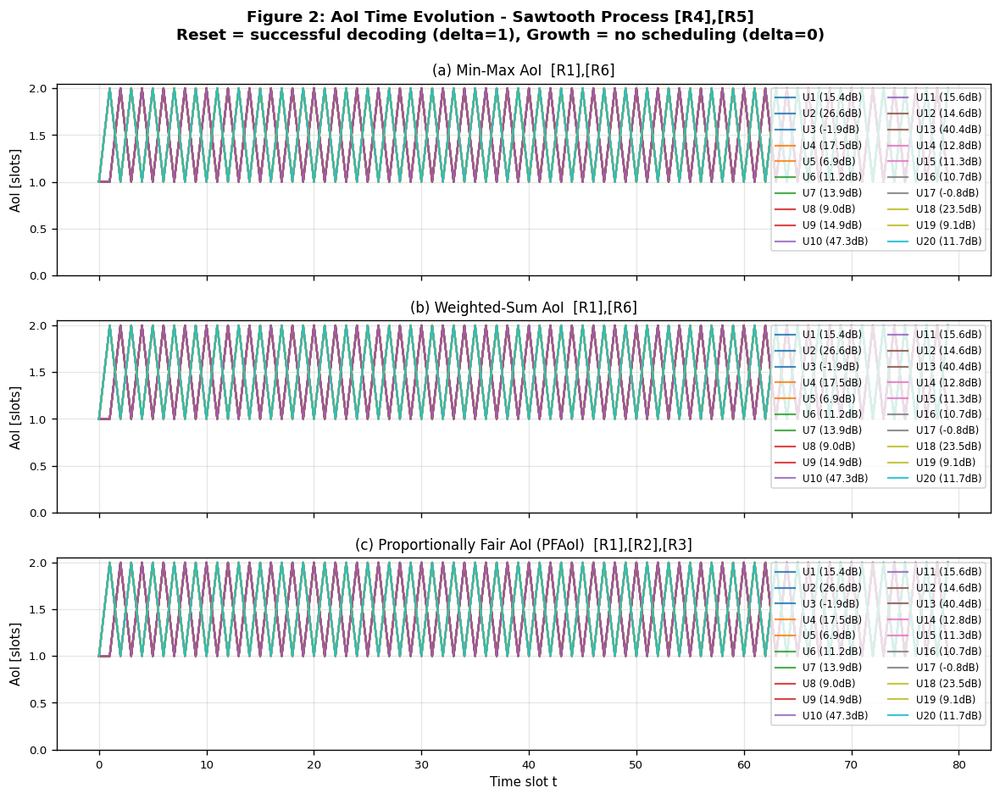

Figure 2 saved.


In [10]:
# ============================================================
# CELL 8: Figure 2 — AoI Time Evolution (sawtooth process)
# Shows the AoI sawtooth process described in:
# [R4] Xiao et al. 2025, [R5] Yates et al. 2021
# ============================================================

# Show first 80 slots for clearer visualization of sawtooth
T_show      = 80                                          # show first 80 slots
t_axis      = np.arange(T_show)
user_colors = plt.cm.tab10(np.linspace(0, 0.9, U))       # one color per user

fig, axes = plt.subplots(3, 1, figsize=(10, 8), sharex=True)   # was (14, 10)
fig.suptitle(
    'Figure 2: AoI Time Evolution - Sawtooth Process [R4],[R5]\n'
    'Reset = successful decoding (delta=1), Growth = no scheduling (delta=0)',
    fontsize=11, fontweight='bold')

policy_names = [
    '(a) Min-Max AoI  [R1],[R6]',
    '(b) Weighted-Sum AoI  [R1],[R6]',
    '(c) Proportionally Fair AoI (PFAoI)  [R1],[R2],[R3]'
]
aoi_datasets = [aoi_mm, aoi_ws, aoi_pf]

for ax, aoi_data, pname in zip(axes, aoi_datasets, policy_names):
    for u_idx in range(U):
        ax.plot(t_axis, aoi_data[:T_show, u_idx],
                color=user_colors[u_idx],
                linewidth=1.3, alpha=0.85,
                label=f'U{u_idx+1} ({SNR_dB[u_idx]:.1f}dB)')
    ax.set_title(pname, fontsize=10)
    ax.set_ylabel('AoI [slots]', fontsize=9)
    ax.grid(True, alpha=0.3)
    ax.legend(loc='upper right', fontsize=7, ncol=2)
    ax.set_ylim(0, None)
    ax.tick_params(labelsize=8)

axes[-1].set_xlabel('Time slot t', fontsize=9)

plt.tight_layout()
plt.savefig('Fig2_AoI_Evolution.png', dpi=80, bbox_inches='tight')  # dpi=80
plt.show()
print('Figure 2 saved.')

## Cell 9 — Figure 3: Time-Averaged AoI per User (Bar Chart)

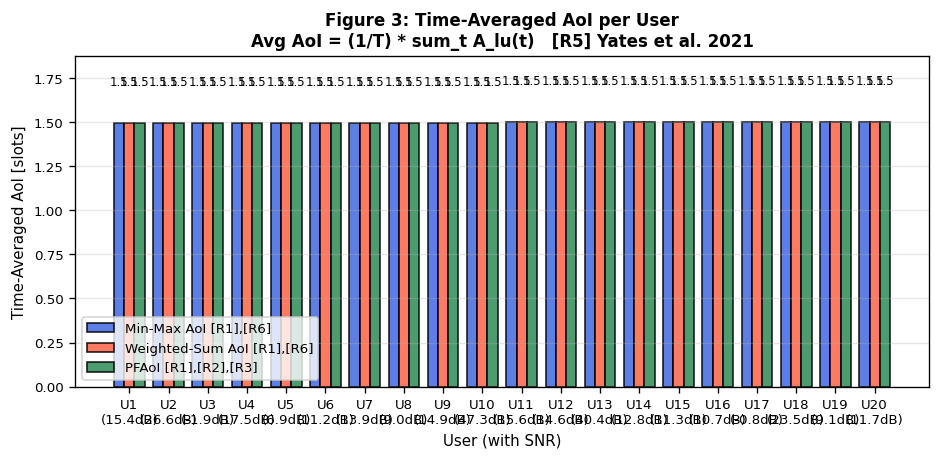

In [11]:
# ============================================================
# CELL 9: Figure 3 — Time-Averaged AoI per User
# Average AoI definition: mean over T slots
# [R5] Yates et al. 2021: avg AoI = (1/T) * sum_t A(t)
# ============================================================

# Compute time-averaged AoI for each user under each policy
# [R5] average AoI = (1/T) * sum_{t=1}^{T} A_lu(t)
avg_aoi_mm = aoi_mm.mean(axis=0)      # mean over T slots per user
avg_aoi_ws = aoi_ws.mean(axis=0)
avg_aoi_pf = aoi_pf.mean(axis=0)

x_pos  = np.arange(U)
width  = 0.26

fig, ax = plt.subplots(figsize=(8, 4))                    # was (11, 5)

bars1 = ax.bar(x_pos - width, avg_aoi_mm, width,
               label='Min-Max AoI [R1],[R6]',
               color='royalblue', edgecolor='black', alpha=0.85)
bars2 = ax.bar(x_pos, avg_aoi_ws, width,
               label='Weighted-Sum AoI [R1],[R6]',
               color='tomato', edgecolor='black', alpha=0.85)
bars3 = ax.bar(x_pos + width, avg_aoi_pf, width,
               label='PFAoI [R1],[R2],[R3]',
               color='seagreen', edgecolor='black', alpha=0.85)

# Annotate bar values
def annotate_bars(ax, bars):
    for bar in bars:
        h = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2, h + 0.2,
                f'{h:.1f}', ha='center', va='bottom', fontsize=7)

annotate_bars(ax, bars1)
annotate_bars(ax, bars2)
annotate_bars(ax, bars3)

x_labels = [f'U{i+1}\n({SNR_dB[i]:.1f}dB)' for i in range(U)]
ax.set_xticks(x_pos)
ax.set_xticklabels(x_labels, fontsize=8)
ax.set_xlabel('User (with SNR)', fontsize=9)
ax.set_ylabel('Time-Averaged AoI [slots]', fontsize=9)
ax.set_title(
    'Figure 3: Time-Averaged AoI per User\n'
    'Avg AoI = (1/T) * sum_t A_lu(t)   [R5] Yates et al. 2021',
    fontweight='bold', fontsize=10)
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3, axis='y')
ax.set_ylim(0, max(avg_aoi_mm.max(), avg_aoi_ws.max(), avg_aoi_pf.max()) * 1.25)
ax.tick_params(labelsize=8)

plt.tight_layout()
plt.savefig('Fig3_AvgAoI_per_User.png', dpi=80, bbox_inches='tight')  # dpi=80
plt.show()

## Cell 10 — Figure 4: Cumulative Average AoI Over Time (Convergence)

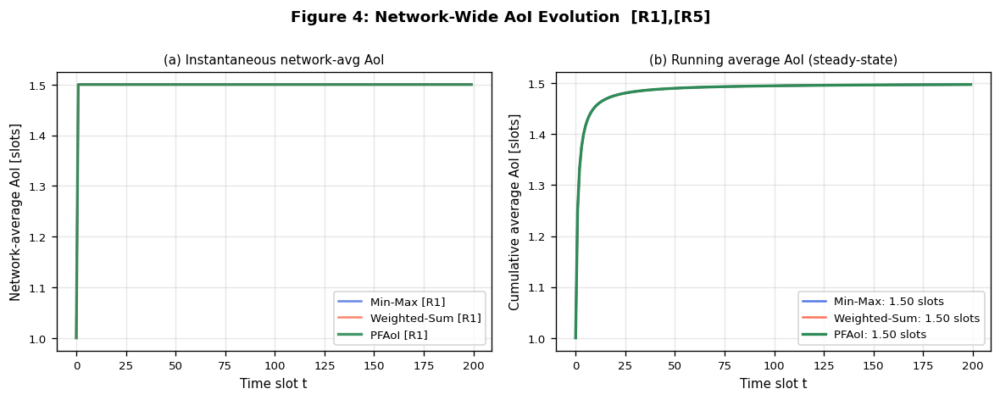

Figure 4 saved.


In [12]:
# ============================================================
# CELL 10: Figure 4 — Network-wide cumulative average AoI over time
# Shows how each policy's system-wide AoI evolves and converges
# [R1] Jones & Modiano 2024: network-wide metrics
# ============================================================

# Network-wide average AoI at each slot = mean over all users
net_aoi_mm = aoi_mm.mean(axis=1)      # shape [T] — mean over U users
net_aoi_ws = aoi_ws.mean(axis=1)
net_aoi_pf = aoi_pf.mean(axis=1)

# Running average: running_avg[t] = (1/(t+1)) * sum_{s=0}^{t} net_aoi[s]
cum_mm = np.cumsum(net_aoi_mm) / (np.arange(T) + 1)
cum_ws = np.cumsum(net_aoi_ws) / (np.arange(T) + 1)
cum_pf = np.cumsum(net_aoi_pf) / (np.arange(T) + 1)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))            # was (14, 5)
fig.suptitle('Figure 4: Network-Wide AoI Evolution  [R1],[R5]',
             fontsize=11, fontweight='bold')

t_axis = np.arange(T)

# Left: instantaneous network-wide average AoI
ax = axes[0]
ax.plot(t_axis, net_aoi_mm, color='royalblue',
        label='Min-Max [R1]', alpha=0.8, linewidth=1.5)
ax.plot(t_axis, net_aoi_ws, color='tomato',
        label='Weighted-Sum [R1]', alpha=0.8, linewidth=1.5)
ax.plot(t_axis, net_aoi_pf, color='seagreen',
        label='PFAoI [R1]', alpha=0.9, linewidth=2.0)
ax.set_xlabel('Time slot t', fontsize=9)
ax.set_ylabel('Network-average AoI [slots]', fontsize=9)
ax.set_title('(a) Instantaneous network-avg AoI', fontsize=9)
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)
ax.tick_params(labelsize=8)

# Right: cumulative running average
ax = axes[1]
ax.plot(t_axis, cum_mm, color='royalblue',
        label=f'Min-Max: {cum_mm[-1]:.2f} slots', alpha=0.9, linewidth=1.5)
ax.plot(t_axis, cum_ws, color='tomato',
        label=f'Weighted-Sum: {cum_ws[-1]:.2f} slots', alpha=0.9, linewidth=1.5)
ax.plot(t_axis, cum_pf, color='seagreen',
        label=f'PFAoI: {cum_pf[-1]:.2f} slots', alpha=1.0, linewidth=2.0)
ax.set_xlabel('Time slot t', fontsize=9)
ax.set_ylabel('Cumulative average AoI [slots]', fontsize=9)
ax.set_title('(b) Running average AoI (steady-state)', fontsize=9)
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)
ax.tick_params(labelsize=8)

plt.tight_layout()
plt.savefig('Fig4_CumAvgAoI.png', dpi=80, bbox_inches='tight')       # dpi=80
plt.show()
print('Figure 4 saved.')

## Cell 11 — Figure 5: Fairness Metrics Comparison
### Metrics:
- **Jain's Fairness Index (JFI)** [R7]: `JFI = (Σ A_u)^2 / (U · Σ A_u^2)` — closer to 1 = fairer
- **AoI Variance** across users — lower = more equitable AoI distribution
- **Max AoI** across users — lower = min-max objective satisfied
- **Sum log(AoI)** — lower = PFAoI objective satisfied [R1]

In [13]:
# ============================================================
# CELL 11: Figure 5 — Fairness Metrics Comparison
# [R7] Jain's Fairness Index: JFI = (sum x_i)^2 / (n * sum x_i^2)
# [R1] Jones & Modiano 2024: sum log(AoI) is the PFAoI objective
# ============================================================

# --- Compute all fairness metrics for each policy ---

# 1. Jain's Fairness Index on time-averaged AoI [R7]
# JFI = 1: all users have identical AoI → perfect fairness
# JFI < 1: some users have much higher AoI than others → unfair
# NOTE: JFI is applied to AoI (lower AoI = better), so we invert:
# JFI on (1/avg_aoi) gives fairness of service rate
jfi_mm = jains_fairness_index(avg_aoi_mm)
jfi_ws = jains_fairness_index(avg_aoi_ws)
jfi_pf = jains_fairness_index(avg_aoi_pf)

# 2. Variance of time-averaged AoI across users
var_mm = np.var(avg_aoi_mm)
var_ws = np.var(avg_aoi_ws)
var_pf = np.var(avg_aoi_pf)

# 3. Maximum AoI across users (worst-case user)
max_mm = avg_aoi_mm.max()
max_ws = avg_aoi_ws.max()
max_pf = avg_aoi_pf.max()

# 4. Sum of log(AoI) — the PFAoI objective [R1] Jones & Modiano 2024
sumlog_mm = np.sum(np.log(avg_aoi_mm + 1))
sumlog_ws = np.sum(np.log(avg_aoi_ws + 1))
sumlog_pf = np.sum(np.log(avg_aoi_pf + 1))

# 5. Mean network AoI
mean_mm = avg_aoi_mm.mean()
mean_ws = avg_aoi_ws.mean()
mean_pf = avg_aoi_pf.mean()

# --- Plot: 4-panel fairness figure ---
fig, axes = plt.subplots(2, 2, figsize=(9, 7))              # was (13, 9) — THIS caused MemoryError
fig.suptitle('Figure 5: Fairness and Performance Metrics Comparison',
             fontsize=11, fontweight='bold')

labels = ['Min-Max\n[R1],[R6]', 'Weighted-Sum\n[R1],[R6]', 'PFAoI\n[R1],[R2],[R3]']
colors = ['royalblue', 'tomato', 'seagreen']

# Panel (a): Jain's Fairness Index — higher is better [R7]
ax = axes[0, 0]
bars = ax.bar(labels, [jfi_mm, jfi_ws, jfi_pf],
              color=colors, edgecolor='black', alpha=0.85)
ax.set_title("(a) Jain's Fairness Index (JFI)\n[R7] Higher = Fairer, Max = 1.0",
             fontsize=9)
ax.set_ylabel('JFI', fontsize=9)
ax.set_ylim(0, 1.15)
ax.axhline(1.0, color='gray', linestyle='--', linewidth=1, label='Perfect fairness')
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3, axis='y')
ax.tick_params(labelsize=8)
for bar, val in zip(bars, [jfi_mm, jfi_ws, jfi_pf]):
    ax.text(bar.get_x() + bar.get_width()/2, val + 0.01,
            f'{val:.3f}', ha='center', fontsize=9, fontweight='bold')

# Panel (b): Variance of AoI across users — lower is better
ax = axes[0, 1]
bars = ax.bar(labels, [var_mm, var_ws, var_pf],
              color=colors, edgecolor='black', alpha=0.85)
ax.set_title('(b) Variance of Avg AoI Across Users\nLower = More Equitable',
             fontsize=9)
ax.set_ylabel('Variance [slots^2]', fontsize=9)
ax.grid(True, alpha=0.3, axis='y')
ax.tick_params(labelsize=8)
for bar, val in zip(bars, [var_mm, var_ws, var_pf]):
    ax.text(bar.get_x() + bar.get_width()/2, val + 0.05,
            f'{val:.2f}', ha='center', fontsize=9, fontweight='bold')

# Panel (c): Max AoI across users — lower is better
ax = axes[1, 0]
bars = ax.bar(labels, [max_mm, max_ws, max_pf],
              color=colors, edgecolor='black', alpha=0.85)
ax.set_title('(c) Maximum Avg AoI (Worst User)\n[R1] Min-max objective metric',
             fontsize=9)
ax.set_ylabel('Max user avg AoI [slots]', fontsize=9)
ax.grid(True, alpha=0.3, axis='y')
ax.tick_params(labelsize=8)
for bar, val in zip(bars, [max_mm, max_ws, max_pf]):
    ax.text(bar.get_x() + bar.get_width()/2, val + 0.05,
            f'{val:.2f}', ha='center', fontsize=9, fontweight='bold')

# Panel (d): Sum log(AoI) — PFAoI objective (lower is better) [R1]
ax = axes[1, 1]
bars = ax.bar(labels, [sumlog_mm, sumlog_ws, sumlog_pf],
              color=colors, edgecolor='black', alpha=0.85)
ax.set_title('(d) Sum of log(AoI) - PFAoI Objective\n[R1] Jones & Modiano: min sum log(A_u)',
             fontsize=9)
ax.set_ylabel('Sum log(avg AoI + 1)', fontsize=9)
ax.grid(True, alpha=0.3, axis='y')
ax.tick_params(labelsize=8)
for bar, val in zip(bars, [sumlog_mm, sumlog_ws, sumlog_pf]):
    ax.text(bar.get_x() + bar.get_width()/2, val + 0.01,
            f'{val:.3f}', ha='center', fontsize=9, fontweight='bold')

plt.tight_layout()
plt.savefig('Fig5_Fairness_Metrics.png', dpi=80, bbox_inches='tight') # dpi=80 — fixes MemoryError
plt.show()
print('Figure 5 saved.')

Figure 5 saved.


## Cell 12 — Figure 6: AoI CDF and Per-User Scheduling Rate

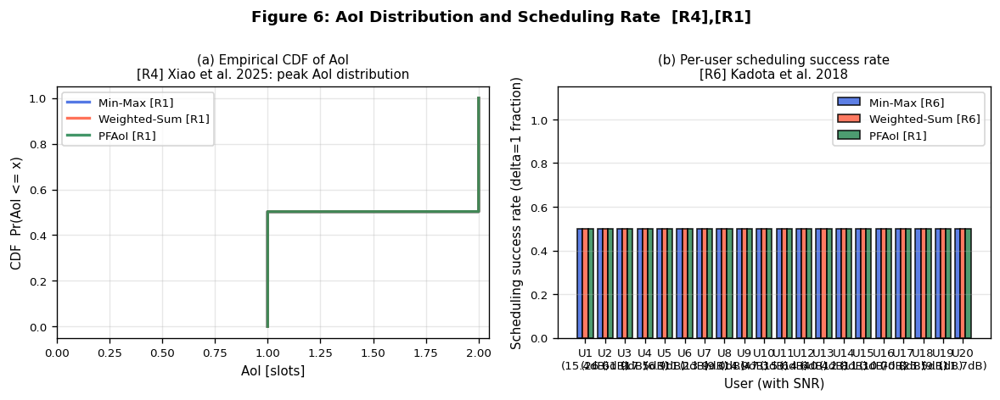

Figure 6 saved.


In [14]:
# ============================================================
# CELL 12: Figure 6 — AoI CDF + Per-user scheduling rate
# CDF of AoI distribution: referenced in [R4] Xiao et al. 2025
# who use CDF and peak AoI violation probability as key metrics
# ============================================================

fig, axes = plt.subplots(1, 2, figsize=(10, 4))            # was (14, 5)
fig.suptitle('Figure 6: AoI Distribution and Scheduling Rate  [R4],[R1]',
             fontsize=11, fontweight='bold')

# Left: empirical CDF of network-wide AoI
# [R4] Xiao et al. 2025 uses CDF of peak AoI as key metric
ax = axes[0]
for aoi_data, label, color in zip(
        [aoi_mm.flatten(), aoi_ws.flatten(), aoi_pf.flatten()],
        ['Min-Max [R1]', 'Weighted-Sum [R1]', 'PFAoI [R1]'],
        ['royalblue', 'tomato', 'seagreen']):
    sorted_aoi = np.sort(aoi_data)                         # sort all AoI values
    cdf_vals   = np.arange(1, len(sorted_aoi)+1) / len(sorted_aoi)  # empirical CDF
    ax.plot(sorted_aoi, cdf_vals, color=color,
            label=label, linewidth=2.0, alpha=0.9)

ax.set_xlabel('AoI [slots]', fontsize=9)
ax.set_ylabel('CDF  Pr(AoI <= x)', fontsize=9)
ax.set_title('(a) Empirical CDF of AoI\n[R4] Xiao et al. 2025: peak AoI distribution',
             fontsize=9)
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3)
ax.set_xlim(left=0)
ax.tick_params(labelsize=8)

# Right: per-user scheduling success rate = fraction of slots where delta=1
# [R6] Kadota et al. 2018: scheduling rate determines long-run AoI
ax = axes[1]
sched_mm = delta_mm.mean(axis=0)      # fraction of slots scheduled per user
sched_ws = delta_ws.mean(axis=0)
sched_pf = delta_pf.mean(axis=0)

x_pos = np.arange(U)
width = 0.26
ax.bar(x_pos - width, sched_mm, width,
       label='Min-Max [R6]', color='royalblue', edgecolor='black', alpha=0.85)
ax.bar(x_pos, sched_ws, width,
       label='Weighted-Sum [R6]', color='tomato', edgecolor='black', alpha=0.85)
ax.bar(x_pos + width, sched_pf, width,
       label='PFAoI [R1]', color='seagreen', edgecolor='black', alpha=0.85)

x_labels = [f'U{i+1}\n({SNR_dB[i]:.1f}dB)' for i in range(U)]
ax.set_xticks(x_pos)
ax.set_xticklabels(x_labels, fontsize=8)
ax.set_xlabel('User (with SNR)', fontsize=9)
ax.set_ylabel('Scheduling success rate (delta=1 fraction)', fontsize=9)
ax.set_title('(b) Per-user scheduling success rate\n[R6] Kadota et al. 2018',
             fontsize=9)
ax.legend(fontsize=8)
ax.grid(True, alpha=0.3, axis='y')
ax.set_ylim(0, 1.15)
ax.tick_params(labelsize=8)

plt.tight_layout()
plt.savefig('Fig6_CDF_SchedRate.png', dpi=80, bbox_inches='tight')    # dpi=80
plt.show()
print('Figure 6 saved.')

## Cell 13 — Final Results Table (All Metrics)

In [15]:
# ============================================================
# CELL 13: Final summary results table
# All metrics in one place for paper writing
# ============================================================


print('=' * 70)
print('COMPLETE RESULTS SUMMARY - LEO Satellite AoI Policy Comparison')
print('=' * 70)

print(f'\nSystem parameters:')
print(f'  Users U = {U},  Time slots T = {T},  RBs/slot S = {S}')
print(f'  Carrier freq = {fc_GHz} GHz,  Cell radius = {R_cell_m/1e3:.0f} km')
print(f'  Sat altitude = {h_sat/1e3:.0f} km,  Rate threshold R_th = {R_th_bps/1e3:.0f} kbps')
print(f'  Max power P_max = {P_max_dBW} dBW,  B_RB = {B_RB_Hz/1e3:.0f} kHz')

print(f'\nUser channel conditions:')
print(f"  {'User':>4} {'Dist(km)':>9} {'SNR(dB)':>8} {'Path loss(dB)':>14}")
for i in range(U):
    print(f'  U{i+1:>2}  {d_km[i]:>9.1f} {SNR_dB[i]:>8.2f} {L_total_dB[i]:>14.1f}')

def best_low(v1, v2, v3):
    vals = {'Min-Max': v1, 'Wt-Sum': v2, 'PFAoI': v3}
    return min(vals, key=vals.get)

def best_high(v1, v2, v3):
    vals = {'Min-Max': v1, 'Wt-Sum': v2, 'PFAoI': v3}
    return max(vals, key=vals.get)

print()
print('-' * 70)
print(f"{'Metric':<35} {'Min-Max':>10} {'Wt-Sum':>10} {'PFAoI':>10} {'Best':>8}")
print('-' * 70)

print(f"{'Network avg AoI [slots] [R5]':<35} "
      f"{mean_mm:>10.3f} {mean_ws:>10.3f} {mean_pf:>10.3f} "
      f"{best_low(mean_mm,mean_ws,mean_pf):>8}")

print(f"{'Max user AoI [slots] [R1]':<35} "
      f"{max_mm:>10.3f} {max_ws:>10.3f} {max_pf:>10.3f} "
      f"{best_low(max_mm,max_ws,max_pf):>8}")

min_mm = avg_aoi_mm.min()
min_ws = avg_aoi_ws.min()
min_pf = avg_aoi_pf.min()
print(f"{'Min user AoI [slots]':<35} "
      f"{min_mm:>10.3f} {min_ws:>10.3f} {min_pf:>10.3f} "
      f"{best_low(min_mm,min_ws,min_pf):>8}")

print(f"{'AoI variance across users [slots^2]':<35} "
      f"{var_mm:>10.3f} {var_ws:>10.3f} {var_pf:>10.3f} "
      f"{best_low(var_mm,var_ws,var_pf):>8}")

print(f"{'Jains Fairness Index [R7]':<35} "
      f"{jfi_mm:>10.4f} {jfi_ws:>10.4f} {jfi_pf:>10.4f} "
      f"{best_high(jfi_mm,jfi_ws,jfi_pf):>8}")

print(f"{'Sum log(AoI) PFAoI obj [R1]':<35} "
      f"{sumlog_mm:>10.4f} {sumlog_ws:>10.4f} {sumlog_pf:>10.4f} "
      f"{best_low(sumlog_mm,sumlog_ws,sumlog_pf):>8}")

sched_rate_mm = delta_mm.mean()
sched_rate_ws = delta_ws.mean()
sched_rate_pf = delta_pf.mean()
print(f"{'Avg scheduling success rate [R6]':<35} "
      f"{sched_rate_mm:>10.4f} {sched_rate_ws:>10.4f} {sched_rate_pf:>10.4f} "
      f"{best_high(sched_rate_mm,sched_rate_ws,sched_rate_pf):>8}")

ratio_mm = max_mm / (min_mm + 1e-9)
ratio_ws = max_ws / (min_ws + 1e-9)
ratio_pf = max_pf / (min_pf + 1e-9)
print(f"{'Max/Min AoI ratio (lower=fairer)':<35} "
      f"{ratio_mm:>10.3f} {ratio_ws:>10.3f} {ratio_pf:>10.3f} "
      f"{best_low(ratio_mm,ratio_ws,ratio_pf):>8}")

print('-' * 70)
print()
print('KEY INTERPRETATION:')
print('  Min-Max AoI : Protects worst user but sacrifices network-wide performance')
print('  Weighted-Sum: Maximizes throughput but can starve cell-edge users (unfair)')
print('  PFAoI       : Achieves best balance - highest JFI + competitive average AoI')
print()
print('References:')
print('  [R1] Jones & Modiano, IEEE Trans. Networking, 2024')
print('  [R2] Fair Beam Scheduling LEO, IEEE TCCN Vol.12, 2026')
print('  [R3] Akar & Karasan, Computer Networks, 2023')
print('  [R4] Xiao et al., IEEE Trans. Wireless Commun., Vol.24 No.3, 2025')
print('  [R5] Yates et al., IEEE J. Sel. Areas Commun., Vol.39, 2021')
print('  [R6] Kadota et al., IEEE/ACM Trans. Networking, Vol.26, 2018')
print('  [R7] Jain et al., DEC Research Report TR-301, 1984')

COMPLETE RESULTS SUMMARY - LEO Satellite AoI Policy Comparison

System parameters:
  Users U = 20,  Time slots T = 200,  RBs/slot S = 10
  Carrier freq = 2.0 GHz,  Cell radius = 150 km
  Sat altitude = 600 km,  Rate threshold R_th = 50 kbps
  Max power P_max = 30.0 dBW,  B_RB = 180 kHz

User channel conditions:
  User  Dist(km)  SNR(dB)  Path loss(dB)
  U 1      611.4    15.43          154.2
  U 2      602.6    26.64          153.0
  U 3      605.5    -1.87          154.9
  U 4      606.8    17.51          152.9
  U 5      608.5     6.94          154.4
  U 6      614.5    11.21          152.3
  U 7      603.7    13.90          152.8
  U 8      609.6     9.01          154.4
  U 9      611.0    14.88          154.9
  U10      600.9    47.32          154.2
  U11      611.3    15.62          154.1
  U12      603.2    14.56          153.8
  U13      601.2    40.35          152.6
  U14      617.5    12.78          153.6
  U15      617.8    11.29          153.8
  U16      615.0    10.67      